# Environmental Analytics Lab 6
## Semester 2, 2020-21
## Dr. Bianca Schoen-Phelan
Based on Geopandas documentation and others, see lecture notes.


---


**Task**: Run the cells that contain examples (either by using the play button or by typeing `shift+Enter`). Do the exercises that are marked with "**Task**". Tasks are now a sub-section in the notebook, so you can see in the table of contents (click into left gutter of notebook) how many there are and have direct access.


---



First take a copy of this colab notebook to your own drive. Then edit. Then submit. Please remember that marks are only awarded if the discussion component is fulfilled as well.

If you are struggeling with DataFrames and accessing and manipulating data in them, here's a great [10 minutes Pandas Guide](https://pandas.pydata.org/pandas-docs/stable/user_guide/10min.html) to consider.


---



**This lab needs to be uploaded!**

In [2]:
# the usual installs
%%time 
# tends to take around 7 minutes
!apt update
!apt upgrade
!apt install gdal-bin python-gdal python3-gdal 
# Install rtree - Geopandas requirement
!apt install python3-rtree 
# Install Geopandas
!pip install git+git://github.com/geopandas/geopandas.git
# Install descartes - Geopandas requirement
!pip install descartes 

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [697 B]
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Get:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Get:8 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:9 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:10 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:12 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Ign:13 https://developer.download.nvidia.com/compute/c

## Static Maps
To a large extent this is what we have been working on so far. This means we are going to do a bit of revision now together and build on top of this. If you'd like to revise your plotting skills, please also look at [this page (click)](https://geopandas.org/docs/user_guide/mapping.html).

`plot()` in `GeoPandas` uses `matplotlib`'s `pyplot`.

In [3]:
# imports for plotting
import geopandas as gpd
from pyproj import CRS
import matplotlib.pyplot as plt

In [6]:
# mount google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


*Remember that you must change all the links to reflect your file paths!*

The following files are available in the [`data_share`](https://drive.google.com/drive/folders/175atSe42iR6cu9uLn1iuSnyIbAzbwbMK?usp=sharing) folder.

In [7]:
# getting a couple of files that we will need for plotting.
# Please check your data_share folder for these shapefiles.
traffic_fp = "/content/drive/MyDrive/Environmental Analytics/gis_osm_traffic_free_1.shp"
railways_fp = "/content/drive/MyDrive/Environmental Analytics/gis_osm_railways_free_1.shp"

traffic = gpd.read_file(traffic_fp)
railways = gpd.read_file(railways_fp)

Before plotting let's do our usual inspection of what the files have to offer and we also need to make sure that their CRSs are the same.

In [8]:
traffic.head()

,osm_id,code,fclass,name,geometry
0,350258,5206,motorway_junction,Sheephill,POINT (-6.32419 54.21849)
1,350462,5206,motorway_junction,None,POINT (-6.25937 54.34158)
2,350466,5204,crossing,None,POINT (-6.26026 54.33950)
3,350856,5206,motorway_junction,None,POINT (-6.27793 54.33351)
4,351200,5202,mini_roundabout,None,POINT (-6.15122 54.41476)


In [9]:
# which categories do we find in fclass?
# traffic.fclass.unique() 
traffic['fclass'].unique() # this and the above line mean the same

array(['motorway_junction', 'crossing', 'mini_roundabout',
       'traffic_signals', 'stop', 'turning_circle', 'speed_camera',
       'fuel', 'weir', 'lock_gate', 'slipway', 'parking', 'marina',
       'parking_underground', 'parking_multistorey', 'parking_bicycle',
       'waterfall', 'service', 'street_lamp', 'dam'], dtype=object)

In [10]:
# grouping and counting and sorting
traffic_grouped = traffic[['fclass','geometry']].groupby(['fclass'])['geometry'] \
                  .count() \
                  .reset_index(name='count') \
                  .sort_values(['count'], ascending=False)

In [ ]:
traffic_grouped

In [ ]:
railways.head()

In [11]:
railways.fclass.unique()

array(['rail', 'tram', 'narrow_gauge', 'miniature_railway', 'monorail'],
      dtype=object)

In [ ]:
print(len(traffic))
print(len(railways))

In [ ]:
print(traffic.crs)
print(railways.crs)

They are all in the same CRS, but this CRS is not very useful for analysis purposes. Let's convert them into an Irish context.

You can check using the epsg (their [old website](http://epsg.io/) is actually much faster and easier to use than [the new site](https://epsg.org/home.html), and luckily, is still available) or [spatialreference](https://spatialreference.org/) website.

In [12]:
# copy because we might want to use it later
traffic_4326 = traffic.copy()
railways_4326 = railways.copy()

# now convert to something a bit more useful
traffic_2157 = traffic.to_crs(epsg=2157)
railways_2157 = railways.to_crs(epsg=2157)

In [13]:
# check they are all the same and we haven't messed anything up
# in the prior step
traffic_2157.crs == railways_2157.crs

True

To make visualisations using `plot()` we have the following options:
* Polygon: Define the classification scheme using the `scheme` parameter. Change the `colormap` using the `cmap` parameter. Add a little bit of transparency using the `alpha` parameter (ranges from 0 to 1 where 0 is fully transparent).
* LineString: adjust colour using `color` parameter and change the linewidth if needed.

Link to [matplotlib documentation](https://matplotlib.org/stable/index.html).

For easier control of where elements are going, we are using a subplot functionality.

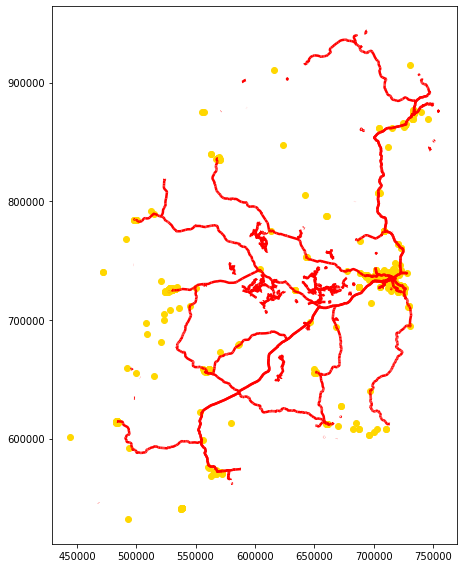

In [14]:
# Let's start with a very naive plot
# Create one subplot. Control figure size in here.
fig, ax = plt.subplots(figsize=(12,8))

traffic_2157[traffic_2157['fclass']=='parking_bicycle'].plot(ax=ax, color="gold")
railways_2157.plot(ax=ax, color="red", linewidth=2.5)

# Remove the empty white-space around the axes
plt.tight_layout()

## Adding a Base Map

Often, it can be very useful to put a map in the background to a plot. 
The background map shows contextual information, such as streets and placenames. 

A Python library called `contextily` is a handy package that can be used to fetch geospatial raster files and add them to your maps. Map tiles are typically distributed in **Web Mercator projection** [(EPSG:3857)](http://epsg.io/3857), hence it is often necessary to reproject all the spatial data into Web Mercator before visualising the data.

In [15]:
# reprojections for web map display
traffic_3857 = traffic_2157.to_crs(epsg=3857)
railways_3857 = railways_2157.to_crs(epsg=3857)

In [16]:
!pip install contextily

     |████████████████████████████████| 19.1MB 1.3MB/s 


In [17]:
import contextily as ctx

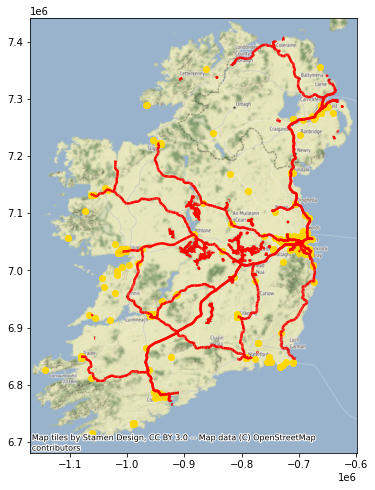

In [18]:
# Control figure size in here
fig, ax = plt.subplots(figsize=(12,8))

# Plot the data
traffic_3857[traffic_3857['fclass']=='parking_bicycle'].plot(ax=ax, color="gold")
railways_3857.plot(ax=ax, color='red', linewidth=2.5)

# Add basemap 
ctx.add_basemap(ax)

This plot doesn't say that very much yet. 

### Task 1
Using the skills you have learnt so far, come up with an investigation around traffic and railways, that uses the classification principle that you learnt in the last lab and plot the result as a map.

For this, you can also make use of any other data set that you feel enhances the investigation.

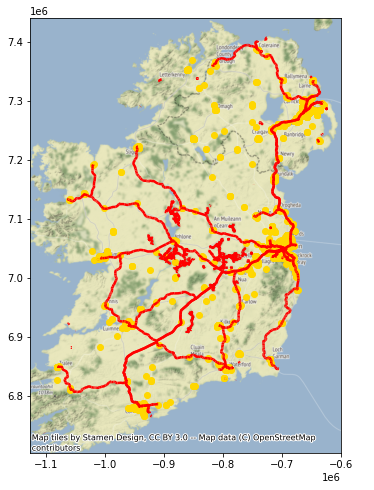

In [19]:
# Your code goes here
# Control figure size in here
fig, ax = plt.subplots(figsize=(12,8))

# Plot the data
traffic_3857[traffic_3857['fclass']=='traffic_signals'].plot(ax=ax, color="gold")
railways_3857.plot(ax=ax, color='red', linewidth=2.5)

# Add basemap 
ctx.add_basemap(ax)

## Interactive Maps
The next cells will show us how to publish data from Python on interactive [leaflet.js](https://leafletjs.com/) maps.

JavaScript (JS) is a programming language for adding interactive content (such a zoomamble maps!) on webpages. Leaflet is a popular JavaScript library for creating interactive maps for webpages ([OpenLayers](https://openlayers.org/) is another JavaScript library for the same purpose).

Here, will mainly focus on [Folium](https://python-visualization.github.io/folium/) - a Python library that makes it easy to convert data from (Geo)DataFrames into interactive Leaflet maps.

Familiarise yourself with the:
*  [Folium Documentation](https://python-visualization.github.io/folium/)
*  [Example Gallery](https://nbviewer.jupyter.org/github/python-visualization/folium/tree/master/examples/)
*  [Quickstart Guide](https://python-visualization.github.io/folium/quickstart.html)

Some very important things to consider around CRS and folium/leaflet.js:


*   Regardless of the coordinate system of the actual map displayed, all coordinates passed to Leaflet functions/methods are always [EPSG:4326](https://epsg.io/4326).
*   The order of coordinates passed to Leaflet is `[latitude, longitude]`
*   When defining or creating a map with folium.Map call, the actual CRS of the map has to be specified.



In [20]:
import folium
import matplotlib.pyplot as plt

We will start by creating a simple interactive web-map without any data on it. We just visualise OpenStreetMap on a specific location of the world.

First thing that we need to do is to create a Map instance and define a location for zooming in the data:

In [21]:
# Create a Map instance
my_map = folium.Map(location=[53.3543, -6.2811], zoom_start=10, control_scale=True)

The first parameter `location` takes a pair of lat, lon values as list as an input which will determine where the map will be positioned when user opens up the map. 

The `zoom_start`-parameter adjusts the default zoom-level for the map (the higher the number the closer the zoom is). 

`control_scale` defines if map should have a scalebar or not.

Let’s see what our map looks like:

In [ ]:
my_map

We can also safe this as a file:

In [22]:
out_fp = "base_map.html"
my_map.save(out_fp)

Open the left panel in this notebook, and click on the folder icon, which is the last icon on the leftmost column. This should show you what is inside your working directory. This file should be present.  

You can open the file in a web browser in order to see the map, or in a text editor in order to see the source definition. To see this file and interact with it, click on the three vertical dots that appear if you move your mouse over the file name and click download.



Let’s create another map with different settings (location, background map, zoom levels). See documentation of the [`Map()`](https://python-visualization.github.io/folium/modules.html#folium.folium.Map) object for all avaiable options.

tiles -parameter is used for changing the background map provider and map style (see the [documentation](https://python-visualization.github.io/folium/modules.html#folium.folium.Map) for all in-built options).

In [23]:
# Let's change the basemap style to 'Stamen Toner'
my_2nd_map = folium.Map(location=[53.0357327477582, -7.29984240371314], tiles='Stamen Toner',
                zoom_start=70, control_scale=True, prefer_canvas=True)

my_2nd_map

### Adding Layers
Let’s first have a look how we can add a simple [marker](https://python-visualization.github.io/folium/modules.html?highlight=marker#folium.map.Marker) on the webmap:

In [24]:
# Create a Map instance
my_map = folium.Map(location=[53.3543, -6.2811],
    zoom_start=15, control_scale=True)

# Add marker
# Run: help(folium.Icon) for more info about icons
folium.Marker(
    location=[53.356268912294645, -6.281866371845699],
    popup='TU Dublin Central Quad',
    icon=folium.Icon(color='green', icon='ok-sign'),
).add_to(my_map)

#Show map
my_map

Folium combines the strenghts of data manipulation in Python with the mapping capabilities of Leaflet.js. So, we would like to include the plotting of interactive maps as the last part of our data analysis workflow.

Let’s see how we can plot data from a GeoDataFrame using folium.

Please remember to update the path to the files. The files are available in your [`data_share`](https://drive.google.com/drive/folders/175atSe42iR6cu9uLn1iuSnyIbAzbwbMK?usp=sharing) folder.

In [25]:
points_of_interest_fp = "/content/drive/MyDrive/Environmental Analytics/gis.osm_pois_a_free_1.shp"
transport_fp = "/content/drive/MyDrive/Environmental Analytics/gis.osm_transport_a_free_1.shp"

points_of_interest = gpd.read_file(points_of_interest_fp)
transport = gpd.read_file(transport_fp)

In [26]:
points_of_interest.head()

,osm_id,code,fclass,name,geometry
0,4054585,2204,park,Griffeen Valley Park,"POLYGON ((-6.44624 53.34316, -6.44572 53.34352..."
1,4078069,2204,park,Merrion Square,"POLYGON ((-6.25173 53.33980, -6.25172 53.33982..."
2,4421186,2301,restaurant,Bell+Bear Coffee House,"POLYGON ((-6.36930 53.40981, -6.36898 53.41007..."
3,4482136,2302,fast_food,McDonalds,"POLYGON ((-6.39588 53.39272, -6.39575 53.39272..."
4,4482177,2099,public_building,None,"POLYGON ((-6.39235 53.39098, -6.39231 53.39101..."


In [27]:
points_of_interest.fclass.unique()

array(['park', 'restaurant', 'fast_food', 'public_building', 'school',
       'supermarket', 'pitch', 'police', 'mall', 'track', 'sports_centre',
       'golf_course', 'hospital', 'town_hall', 'museum', 'university',
       'graveyard', 'stadium', 'college', 'doityourself', 'courthouse',
       'castle', 'attraction', 'theatre', 'fire_station', 'cinema',
       'playground', 'hotel', 'wastewater_plant', 'pub', 'library',
       'wayside_shrine', 'bank', 'recycling', 'archaeological',
       'community_centre', 'convenience', 'zoo', 'monument', 'fountain',
       'ruins', 'food_court', 'car_dealership', 'beverages', 'fort',
       'nursing_home', 'water_works', 'picnic_site', 'viewpoint',
       'shelter', 'caravan_site', 'tower', 'bar', 'embassy',
       'garden_centre', 'cafe', 'gift_shop', 'kindergarten',
       'recycling_glass', 'furniture_shop', 'nightclub',
       'recycling_paper', 'pharmacy', 'mobile_phone_shop', 'shoe_shop',
       'swimming_pool', 'toy_shop', 'doctors', 'toil

In [28]:
len(points_of_interest)

31312

In [29]:
points_of_interest.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [30]:
transport.head()

,osm_id,code,fclass,name,geometry
0,15748499,5622,bus_station,Translink Depot,"POLYGON ((-5.91233 54.59813, -5.91224 54.59829..."
1,16135428,5661,ferry_terminal,Terminal 1,"POLYGON ((-6.13492 53.29613, -6.13453 53.29652..."
2,25727966,5622,bus_station,Zone 14,"POLYGON ((-6.24178 53.42884, -6.24178 53.42890..."
3,26342341,5622,bus_station,Laganside Bus Centre,"POLYGON ((-5.92340 54.60026, -5.92321 54.60028..."
4,28607754,5622,bus_station,Europa Bus Centre,"POLYGON ((-5.93727 54.59496, -5.93688 54.59497..."


In [31]:
transport.fclass.unique()

array(['bus_station', 'ferry_terminal', 'railway_station', 'taxi'],
      dtype=object)

In [ ]:
len(transport)

In [ ]:
transport.crs

In [32]:
schools = points_of_interest[points_of_interest['fclass']=='school']
schools

,osm_id,code,fclass,name,geometry
5,4491082,2082,school,Saint Francis Xavier National Schools,"POLYGON ((-6.38441 53.38372, -6.38433 53.38374..."
13,7839824,2082,school,Saint Mac Dara's Community College,"POLYGON ((-6.33138 53.29808, -6.33095 53.29867..."
19,8053294,2082,school,Coláiste de hÍde,"POLYGON ((-6.35112 53.30118, -6.35091 53.30153..."
21,8584472,2082,school,St Tiernans Community School,"POLYGON ((-6.24236 53.28310, -6.24199 53.28335..."
23,8590201,2082,school,Queen of Angels Primary School,"POLYGON ((-6.22687 53.27708, -6.22557 53.27729..."
...,...,...,...,...,...
31208,554985279,2082,school,None,"POLYGON ((-6.21833 53.33611, -6.21827 53.33613..."
31209,554985655,2082,school,None,"POLYGON ((-8.91115 52.17701, -8.91076 52.17709..."
31246,555780186,2082,school,None,"POLYGON ((-5.98942 54.59332, -5.98847 54.59405..."
31282,556139170,2082,school,St Clares Comprehensive,"POLYGON ((-8.17945 54.30050, -8.17884 54.30175..."


In [33]:
# the data has the locations in polygon format, which we don't need, 
# we just want the locations on maps, we can use centroid (attention: needs a projection!!!!)
schools_3857 = schools.to_crs(epsg=3857)
schools_3857.head()

,osm_id,code,fclass,name,geometry
5,4491082,2082,school,Saint Francis Xavier National Schools,"POLYGON ((-710708.936 7054293.764, -710700.354..."
13,7839824,2082,school,Saint Mac Dara's Community College,"POLYGON ((-704806.098 7038326.151, -704758.475..."
19,8053294,2082,school,Coláiste de hÍde,"POLYGON ((-707003.010 7038902.670, -706980.390..."
21,8584472,2082,school,St Tiernans Community School,"POLYGON ((-694896.281 7035536.352, -694854.837..."
23,8590201,2082,school,Queen of Angels Primary School,"POLYGON ((-693171.541 7034415.437, -693027.249..."


In [34]:
schools_3857['centroid'] = schools_3857['geometry'].centroid
schools_3857 = schools_3857.drop(columns='geometry')
# schools_3857.drop(['geometry'], axis=1)
schools_3857 = schools_3857.rename(columns={'centroid':'geometry'})

schools_3857.head()

,osm_id,code,fclass,name,geometry
5,4491082,2082,school,Saint Francis Xavier National Schools,POINT (-710567.368 7054151.120)
13,7839824,2082,school,Saint Mac Dara's Community College,POINT (-704497.688 7038260.942)
19,8053294,2082,school,Coláiste de hÍde,POINT (-706779.286 7038904.350)
21,8584472,2082,school,St Tiernans Community School,POINT (-694581.774 7035355.087)
23,8590201,2082,school,Queen of Angels Primary School,POINT (-693059.935 7034323.259)


Prepare the data for our interactive map. 

First Step: Make a geo JSON out of the shapefile/GeoDataFrame.

In [35]:
# Convert points to GeoJSON
schools_gjson = folium.features.GeoJson(schools_3857, name="Schools in Ireland")

In [36]:
# Check the GeoJSON features
schools_gjson.data.get('features')

[{'bbox': [-6.383135269783488,
   53.382956802554745,
   -6.383135269783488,
   53.382956802554745],
  'geometry': {'coordinates': [-6.383135269783488, 53.382956802554745],
   'type': 'Point'},
  'id': '5',
  'properties': {'code': 2082,
   'fclass': 'school',
   'name': 'Saint Francis Xavier National Schools',
   'osm_id': '4491082'},
  'type': 'Feature'},
 {'bbox': [-6.328610410461225,
   53.29773010301202,
   -6.328610410461225,
   53.29773010301202],
  'geometry': {'coordinates': [-6.328610410461225, 53.29773010301202],
   'type': 'Point'},
  'id': '13',
  'properties': {'code': 2082,
   'fclass': 'school',
   'name': "Saint Mac Dara's Community College",
   'osm_id': '7839824'},
  'type': 'Feature'},
 {'bbox': [-6.349106348930679,
   53.30118431886008,
   -6.349106348930679,
   53.30118431886008],
  'geometry': {'coordinates': [-6.349106348930679, 53.30118431886008],
   'type': 'Point'},
  'id': '19',
  'properties': {'code': 2082,
   'fclass': 'school',
   'name': 'Coláiste de hÍ

Now we have our school data stored as GeoJSON format which basically contains the data as text in a similar way that it would be written in the .geojson -file.

Add the points onto the Ireland basemap:

In [37]:
# Create a Map instance
my_map = folium.Map(width=800, height=500, location=[53.3543, -6.2811], tiles = 'cartodbpositron', zoom_start=15, control_scale=True, crs='EPSG3857')

# Add points to the map instance
schools_gjson.add_to(my_map)

# Alternative syntax for adding points to the map instance
#my_map.add_child(schools_gjson)

#Show map
my_map

### Layer Control
We can also add a `LayerControl` object on our map, which allows the user to control which map layers are visible. See the [documentation](https://python-visualization.github.io/folium/modules.html) for available parameters (you can e.g. change the position of the layer control icon).

In [38]:
# Create a layer control object and add it to our map instance
folium.LayerControl().add_to(my_map)

#Show map
my_map

### Heat Maps
Folium [plugins](https://python-visualization.github.io/folium/plugins.html) allow us to use popular tools available in leaflet. One of these plugins is [HeatMap](https://python-visualization.github.io/folium/plugins.html#folium.plugins.HeatMap), which creates a heatmap layer from input points.

HeatMap prefers EPSG4326.

Let’s visualise a heatmap of the school distributions in Ireland/zoomed to Dublin using the schools input data. `folium.plugins.HeatMap` requires a list of points, or a numpy array as input, so we need to first manipulate the data a bit:

In [39]:
schools_3857.head()

,osm_id,code,fclass,name,geometry
5,4491082,2082,school,Saint Francis Xavier National Schools,POINT (-710567.368 7054151.120)
13,7839824,2082,school,Saint Mac Dara's Community College,POINT (-704497.688 7038260.942)
19,8053294,2082,school,Coláiste de hÍde,POINT (-706779.286 7038904.350)
21,8584472,2082,school,St Tiernans Community School,POINT (-694581.774 7035355.087)
23,8590201,2082,school,Queen of Angels Primary School,POINT (-693059.935 7034323.259)


In [40]:
schools_4326 = schools_3857.to_crs(epsg=4326)
schools_4326.head()

,osm_id,code,fclass,name,geometry
5,4491082,2082,school,Saint Francis Xavier National Schools,POINT (-6.38314 53.38296)
13,7839824,2082,school,Saint Mac Dara's Community College,POINT (-6.32861 53.29773)
19,8053294,2082,school,Coláiste de hÍde,POINT (-6.34911 53.30118)
21,8584472,2082,school,St Tiernans Community School,POINT (-6.23953 53.28213)
23,8590201,2082,school,Queen of Angels Primary School,POINT (-6.22586 53.27658)


In [41]:
# Get x and y coordinates for each point
schools_4326["x"] = schools_4326["geometry"].apply(lambda geom: geom.x)
schools_4326["y"] = schools_4326["geometry"].apply(lambda geom: geom.y)
schools_4326.head()
# Create a list of coordinate pairs
locations = list(zip(schools_4326["y"], schools_4326["x"]))

In [42]:
# check the data
locations

[(53.382956802554745, -6.383135269783488),
 (53.29773010301202, -6.328610410461225),
 (53.30118431886008, -6.349106348930679),
 (53.282126173018824, -6.239534236626134),
 (53.27658406625782, -6.225863323698668),
 (53.28256115587624, -6.2265243513399735),
 (53.29841195939723, -6.318216298892425),
 (53.298033316785904, -6.318494050144176),
 (54.587620512204055, -5.911826851635982),
 (54.58799502911106, -5.898433342768072),
 (53.30754788944311, -6.335528893405583),
 (53.38719743949776, -6.397724337130771),
 (53.3879818482645, -6.396122910714823),
 (54.591019749583864, -5.890820288424161),
 (54.59220986756583, -5.906131242490741),
 (54.58050756735016, -5.905636018553636),
 (54.57667181727027, -5.911013734950466),
 (54.57493959479611, -5.924360881794805),
 (54.635158121397914, -5.837324588744868),
 (54.58168572043574, -5.929041006296044),
 (54.554600903866834, -5.915508940332406),
 (54.61640836008351, -5.971058989148296),
 (53.236183875148654, -6.1217216329350945),
 (53.23411856016931, -6.1

In [43]:
from folium.plugins import HeatMap

In [44]:
# Create a Map instance
my_map = folium.Map(location=[53.357628006146335, -6.279221713745184], tiles = 'stamentoner', zoom_start=12, control_scale=True)

# Add heatmap to map instance
# Available parameters: 
# HeatMap(data, name=None, min_opacity=0.5, max_zoom=18, max_val=1.0, radius=25, blur=15, gradient=None, overlay=True, control=True, show=True)
HeatMap(locations).add_to(my_map)

# Alternative syntax:
#my_map.add_child(HeatMap(points_array, radius=15))

# Show map
my_map

### Task 2
Create a heat map for Ireland using the transport dataset that we loaded earlier. Take a sub-set of this dataset of a specific type of transport means, and investigate for the Dublin context only. You may want to bring in the counties dataset and do a spatial join to get the Dublin context only.

Then visualise these transport locations on top of the choropleth map using clustered markers using folium’s [MarkerCluster](https://python-visualization.github.io/folium/plugins.html?highlight=marker%20cluster#folium.plugins.MarkerCluster) class.

In [63]:
import geopandas as gpd

In [61]:
fp_counties = "/content/drive/MyDrive/Environmental Analytics/counties_gen.shp"

counties = gpd.read_file(fp_counties)

counties_3857 = counties.to_crs(epsg=3857)
dublin_bus = gdp.sjoin(counties_3857[ counties_3857['COUNTYNAME']=='Dublin City'], bus_3857, op='contains')

,COUNTYNAME,GEOGID,LAND_AREA,TOTAL_AREA,CREATEDATE,geometry
17,South Dublin,C03,223.021268,223.536882,27-03-2012,"POLYGON ((-713802.064 7051323.028, -713348.173..."


In [74]:
# Your code goes here.
fp_counties = "/content/drive/MyDrive/Environmental Analytics/counties_gen.shp"

counties = gpd.read_file(fp_counties)

counties_3857 = counties.to_crs(epsg=3857)


bus = transport[transport['fclass']=='bus_station']
bus_3857 = bus.to_crs(epsg=3857)
#bus_3857.head()

bus_3857['centroid'] = bus_3857['geometry'].centroid
bus_3857 = bus_3857.drop(columns='geometry')
# bus_3857.drop(['geometry'], axis=1)
bus_3857 = bus_3857.rename(columns={'centroid':'geometry'})

fp_counties = "/content/drive/MyDrive/Environmental Analytics/counties_gen.shp"

counties = gpd.read_file(fp_counties)

counties_3857 = counties.to_crs(epsg=3857)
dublin_bus_3857 = gpd.sjoin(counties_3857[ counties_3857['COUNTYNAME']=='Dublin City'], bus_3857, op='contains')

# Convert points to GeoJSON
bus_gjson = folium.features.GeoJson(dublin_bus_3857, name="Bus Stations in Ireland")

bus_4326 = dublin_bus_3857.to_crs(epsg=4326)

bus_4326['centroid'] = bus_4326['geometry'].centroid
bus_4326 = bus_4326.drop(columns='geometry')
# bus_3857.drop(['geometry'], axis=1)
bus_4326 = bus_4326.rename(columns={'centroid':'geometry'})

# Get x and y coordinates for each point
bus_4326["x"] = bus_4326["geometry"].apply(lambda geom: geom.x)
bus_4326["y"] = bus_4326["geometry"].apply(lambda geom: geom.y)
bus_4326.head()
# Create a list of coordinate pairs
bus_locations = list(zip(bus_4326["y"], bus_4326["x"]))

# Create a Map instance
my_map = folium.Map(location=[53.357628006146335, -6.279221713745184], tiles = 'stamentoner', zoom_start=12, control_scale=True)

# Add heatmap to map instance
# Available parameters: 
# HeatMap(data, name=None, min_opacity=0.5, max_zoom=18, max_val=1.0, radius=25, blur=15, gradient=None, overlay=True, control=True, show=True)
HeatMap(bus_locations).add_to(my_map)

# Alternative syntax:
#my_map.add_child(HeatMap(points_array, radius=15))

# Show map
my_map


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



## Choropleth maps in Folium

Let's have a look at how to generate Choropleth maps in folium. We will use a European context example first.

In [75]:
!pip install geojson

In [76]:
import requests
import geojson

In [77]:
# Specify the url for web feature service
url = 'https://kartta.hsy.fi/geoserver/wfs'

# Specify parameters (read data in json format).
# Available feature types in this particular data source: http://geo.stat.fi/geoserver/vaestoruutu/wfs?service=wfs&version=2.0.0&request=describeFeatureType
params = dict(service='WFS',
              version='2.0.0',
              request='GetFeature',
              typeName='asuminen_ja_maankaytto:Vaestotietoruudukko_2018',
              outputFormat='json')

# Fetch data from WFS using requests
r = requests.get(url, params=params)

# Create GeoDataFrame from geojson
data = gpd.GeoDataFrame.from_features(geojson.loads(r.content))

# Check the data
data.head()

,geometry,index,asukkaita,asvaljyys,ika0_9,ika10_19,ika20_29,ika30_39,ika40_49,ika50_59,ika60_69,ika70_79,ika_yli80
0,MULTIPOLYGON Z (((25476499.999 6674248.999 0.0...,3342,108,45,11,23,6,7,26,17,8,6,4
1,MULTIPOLYGON Z (((25476749.997 6674498.998 0.0...,3503,273,35,35,24,52,62,40,26,25,9,0
2,MULTIPOLYGON Z (((25476999.994 6675749.004 0.0...,3660,239,34,46,24,24,45,33,30,25,10,2
3,MULTIPOLYGON Z (((25476999.994 6675499.004 0.0...,3661,202,30,52,37,13,36,43,11,4,3,3
4,MULTIPOLYGON Z (((25476999.994 6675249.005 0.0...,3662,261,30,64,32,36,64,34,20,6,3,2


In [78]:
from pyproj import CRS
# Define crs
data.crs = CRS.from_epsg(3879)

In [79]:
# Re-project to WGS84
data = data.to_crs(epsg=4326)

# Check layer crs definition
print(data.crs)

epsg:4326


In [80]:
# Change the name of a column
data = data.rename(columns={'asukkaita': 'pop18'})

# Create a Geo-id which is needed by the Folium (it needs to have a unique identifier for each row)
data['geoid'] = data.index.astype(str)

# Select only needed columns
data = data[['geoid', 'pop18', 'geometry']]

# Convert to geojson (not needed for the simple coropleth map!)
#pop_json = data.to_json()

#check data
data.head()

,geoid,pop18,geometry
0,0,108,"MULTIPOLYGON Z (((24.57654 60.18042 0.00000, 2..."
1,1,273,"MULTIPOLYGON Z (((24.58102 60.18267 0.00000, 2..."
2,2,239,"MULTIPOLYGON Z (((24.58538 60.19391 0.00000, 2..."
3,3,202,"MULTIPOLYGON Z (((24.58541 60.19166 0.00000, 2..."
4,4,261,"MULTIPOLYGON Z (((24.58544 60.18942 0.00000, 2..."


In [81]:
# Create a Map instance
my_map = folium.Map(location=[60.25, 24.8], tiles = 'cartodbpositron', zoom_start=10, control_scale=True)

# Plot a choropleth map
# Notice: 'geoid' column that we created earlier needs to be assigned always as the first column
folium.Choropleth(
    geo_data=data,
    name='Population in 2018',
    data=data,
    columns=['geoid', 'pop18'],
    key_on='feature.id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    line_color='white', 
    line_weight=0,
    highlight=False, 
    smooth_factor=1.0,
    legend_name= 'Population in Helsinki').add_to(my_map)

#Show map
my_map

### Task 3
Create a choropleth map using folium as in the example above but use our water level dataset that you have seen used in a case study in a prior lab.

In [85]:
# Your Code goes here

water_levels_shp = "/content/drive/MyDrive/Environmental Analytics/IRL_SPAs_ITM.shp"
water = gpd.read_file(water_levels_shp)

water.head()

,SPA,TLAND_OR_N,SOURCE,DWCODE,EUREPORTIN,COUNTY,REPORT,PRODUCEDBY,ACTIVE,GSI_REVIEW,PUBLISH_ON,REPORT_DAT,UPDATED,UPDATED_BY,SHAPE_AREA,SHAPE_LEN,geometry
0,SI,CARRIGBYRNE PWS,EPA,3300PUB1012,IE_SE_G_001_26_002,Wexford,https://secure.dccae.gov.ie/GSI_DOWNLOAD/Groun...,EPA/OCM,YES,YES,YES,2011-12-01,None,None,4.778717e+05,2727.088770,"POLYGON ((683175.968 624298.104, 683054.073 62..."
1,SI,TRIM PWS,EPA,-,-,Meath,https://secure.dccae.gov.ie/GSI_DOWNLOAD/Groun...,EPA/TOBIN,YES,YES,YES,2010-09-01,None,None,9.514113e+04,1179.119235,"POLYGON ((683080.163 755947.629, 683077.746 75..."
2,SI,WATERGRASSHILL PWS,EPA,0500PUB1216,None,Cork,https://secure.dccae.gov.ie/GSI_DOWNLOAD/Groun...,EPA,YES,YES,YES,2012-11-01,None,None,1.835272e+05,2073.649195,"POLYGON ((579002.804 584010.465, 579002.509 58..."
3,SO,BALLYROAN PWS,EPA,-,-,Laois,https://secure.dccae.gov.ie/GSI_DOWNLOAD/Groun...,EPA,YES,YES,YES,2010-04-01,None,None,1.073228e+06,4739.446968,"POLYGON ((647437.908 686590.894, 647444.152 68..."
4,SO,CAPPAMORE PWS,EPA,-,-,Limerick,https://secure.dccae.gov.ie/GSI_DOWNLOAD/Groun...,EPA,None,YES,YES,2010-12-01,None,None,3.066872e+05,4020.227975,"POLYGON ((578957.895 653459.011, 578922.044 65..."


In [89]:
# Create a Map instance
my_map = folium.Map(location=[53.3543, -6.2811], tiles = 'cartodbpositron', zoom_start=10, control_scale=True)

# Plot a choropleth map
# Notice: 'geoid' column that we created earlier needs to be assigned always as the first column
folium.Choropleth(
    geo_data=water,
    name='Population in 2018',
    data=data,
    columns=['geoid', 'pop18'],
    key_on='feature.id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    line_color='white', 
    line_weight=0,
    highlight=False, 
    smooth_factor=1.0,
    legend_name= 'Water Levels Ireland').add_to(my_map)

#Show map
my_map

### Task 4
Share your output from Task 3 via GitHub pages, as explained in the lecture slides for this week.

Provide your link here:
`<your link>`